# Abstracto

La motivacion principal para realizar este proyecto es poder, a traves del analisis de datos y el uso de modelos predictivos, poder predecir cuando lloverá. En el caso de nuestro proyecto en las distintas ciudades que componen los estados de Austrlia Es importante para nosotros esta investigacion ya que nos permite aplicar los conocimientos que hemos ido aprendiendo a lo largo del curso y poder autoevaluarnos de forma de conocer cuanto hemos ido evolucionando.

El principal problema a enfrentar es elegir que variables debemos tener en cuenta al momento de predecir si llovera o no en un determinado lugar. Para esto se realizo primero una investigacion acerca de que variables toman en cuenta los metereologos para poder predecir si llovera o no, para luego realizar un analisis de los datos disponibles de forma de encontrar si se cumplen dichas regularidades que ven los expertos. Al ser un problema cuya respuesta es si llovera o no, se esta frente a un problema de clasificacion por lo que se usaran los algoritmos preparados para tales fines.

Consideramos que la audiencia a la que puede estar destinada la investigacion es toda aquella interesada en conocer que tan viable y certero es el analisis de datos para predecir fenomenos climaticos. Pudiendo abarcar desde estudiantes de Ciencia de datos, que como en nuestro caso, buscan acercarse a esta a herramienta y conocer su funcionamiento a aquellos que trabajan considerando las variables climaticas, o bien, deben conocer las mismas para tomar algun tipo de decision

Audiencia:
Aquellos interesados en conocer que tan viable y certero es el análisis de datos para predecir fenómenos climáticos. Abarcando desde estudiantes de Ciencia de datos, que como en nuestro caso, buscan acercarse a esta a herramienta y conocer su funcionamiento, como aquellos que trabajan considerando las variables climáticas, o bien, deben conocer las mismas para tomar algún tipo de decisión

# Preguntas/hipótesis que queremos responder

Al ver las variables a analizar surgieron las siguientes preguntas con respecto a la posibilidad de lluvias:
¿Cuanto más nublado está el cielo, más probable es que llueva?
¿A mayor humedad, es más probable que llueva?
¿Cuanto más baja es la presión atmosférica, es más probable que llueva?
¿Qué sucede con la presión atmosférica al haber vientos fuertes? 
Al combinarse las variables analizadas ¿Habrá más o menos lluvias?
Esto finalmente lleva a preguntarse:
¿Cuáles son las ciudades con más lluvias? ¿En ellas se cumplen las condiciones anteriores?


# Analisis

In [1]:
import numpy as np 
import pandas as pd 
import missingno as msno
from math import floor
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import re
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import  plot_confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set_theme()
sns.set_palette('colorblind')

In [79]:
pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Importamos los dataset que vamos a utilizar

In [2]:
df = pd.read_csv('/content/weatherAUS.csv')

In [5]:
coordenadas = pd.read_csv("/content/worldcitiespop.csv")

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [6]:
df.isna().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

A travez de la visualizacion en matriz vamos a ver que variables son las que tienen mas valores faltantes 

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

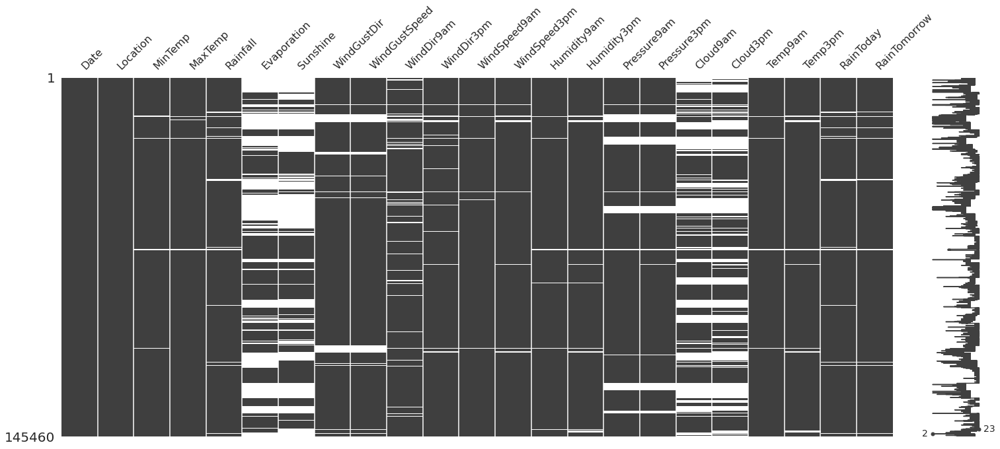

In [17]:
msno.matrix(df)
df.isna().sum()

Podemos observar que las variables con mas valores faltantes son:  "Evaporation", "Sunshine", "Cloud9am", and "Cloud3pm"

En cuanto a las locaciones, buscaremos las coordenadas geograficas de cada una de ellas utilizando el Dataset 'worldcitiespop' 

In [18]:
coordenadas = coordenadas[coordenadas.Country=='au'].drop(['Country'],axis = 1)
coordenadas.head()

,City,AccentCity,Region,Population,Latitude,Longitude
150880,abbotsford,Abbotsford,02,NaN,-33.850000,151.133333
150881,abbotsford,Abbotsford,07,NaN,-37.800000,145.000000
150882,abbotsham,Abbotsham,06,NaN,-41.216667,146.183333
150883,abbotts,Abbotts,08,NaN,-26.316667,118.383333
150884,abercorn,Abercorn,04,NaN,-25.150000,151.033333


Usamos las columnas de Locations(weatherAUS) y AccentCity(worldcitipop) para unir los datasets

In [19]:
df = df.merge(coordenadas,how = 'left', left_on='Location', right_on='AccentCity')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160689 entries, 0 to 160688
Data columns (total 29 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           160689 non-null  object 
 1   Location       160689 non-null  object 
 2   MinTemp        159135 non-null  float64
 3   MaxTemp        159384 non-null  float64
 4   Rainfall       157241 non-null  float64
 5   Evaporation    93334 non-null   float64
 6   Sunshine       81379 non-null   float64
 7   WindGustDir    150152 non-null  object 
 8   WindGustSpeed  150221 non-null  float64
 9   WindDir9am     147360 non-null  object 
 10  WindDir3pm     156101 non-null  object 
 11  WindSpeed9am   158791 non-null  float64
 12  WindSpeed3pm   157513 non-null  float64
 13  Humidity9am    157800 non-null  float64
 14  Humidity3pm    155981 non-null  float64
 15  Pressure9am    145524 non-null  float64
 16  Pressure3pm    145545 non-null  float64
 17  Cloud9am       97175 non-null

In [20]:
df.isna().sum()

Date                 0
Location             0
MinTemp           1554
MaxTemp           1305
Rainfall          3448
Evaporation      67355
Sunshine         79310
WindGustDir      10537
WindGustSpeed    10468
WindDir9am       13329
WindDir3pm        4588
WindSpeed9am      1898
WindSpeed3pm      3176
Humidity9am       2889
Humidity3pm       4708
Pressure9am      15165
Pressure3pm      15144
Cloud9am         63514
Cloud3pm         67162
Temp9am           1935
Temp3pm           3748
RainToday         3448
RainTomorrow      3454
City             45393
AccentCity       45393
Region           45393
Population       93778
Latitude         45393
Longitude        45393
dtype: int64

Como tenemos algunas coordenadas faltantes vamos a usar la API positionstack Geocoding para resolverlo

In [21]:
locations = df.Location[df.Latitude.isna()].unique()
locations

array(['BadgerysCreek', 'CoffsHarbour', 'NorahHead', 'NorfolkIsland',
       'SydneyAirport', 'WaggaWagga', 'MountGinini', 'MelbourneAirport',
       'Nhil', 'GoldCoast', 'MountGambier', 'PearceRAAF', 'PerthAirport',
       'SalmonGums', 'AliceSprings', 'Uluru'], dtype=object)

In [22]:
params = {'access_key':'10ec081c462127bfb9606f2d98b1d5d7','country':'AU'} 
base_url = 'http://api.positionstack.com/v1/forward'
for address in locations:
    if address == 'PearceRAAF':
        query_address ='RAAF Base Pearce'
    else:
        query_address = ' '.join(re.findall('[A-Z][a-z]*', address))
    params['query'] =  query_address
    response = requests.get(base_url, params = params).json()
    try:
        df.loc[df.Location==address,'Latitude'] = response['data'][0]['latitude']
        df.loc[df.Location==address,'Longitude'] = response['data'][0]['longitude']
    except:
        print(params)
        print(response)
        break

{'access_key': '10ec081c462127bfb9606f2d98b1d5d7', 'country': 'AU', 'query': 'Norfolk Island'}
{'error': {'code': 'internal_error', 'message': 'HTTP status code 500 (Internal Server Error)'}}


Date                 0
Location             0
MinTemp           1554
MaxTemp           1305
Rainfall          3448
Evaporation      67355
Sunshine         79310
WindGustDir      10537
WindGustSpeed    10468
WindDir9am       13329
WindDir3pm        4588
WindSpeed9am      1898
WindSpeed3pm      3176
Humidity9am       2889
Humidity3pm       4708
Pressure9am      15165
Pressure3pm      15144
Cloud9am         63514
Cloud3pm         67162
Temp9am           1935
Temp3pm           3748
RainToday         3448
RainTomorrow      3454
City             45393
AccentCity       45393
Region           45393
Population       93778
Latitude         36371
Longitude        36371
dtype: int64

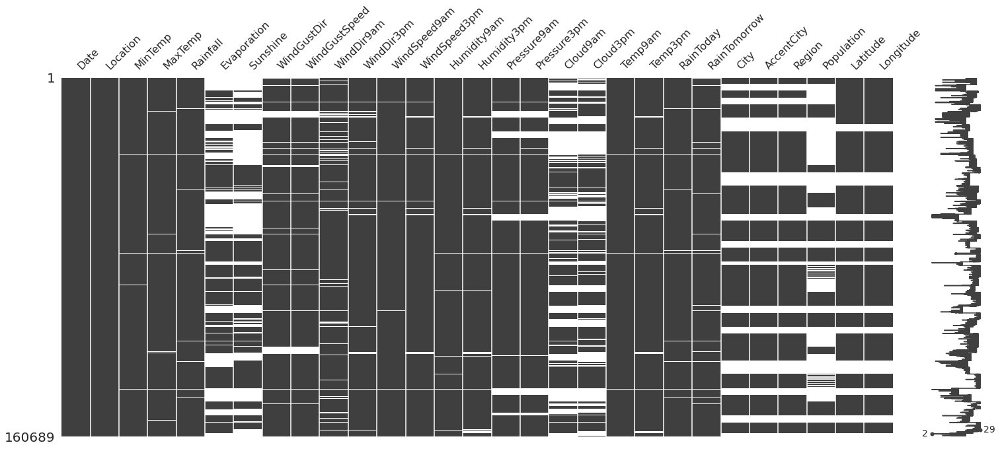

In [23]:
msno.matrix(df)
df.isna().sum()

Vamos a sacas las columnas con mas datos faltantes ,que son "Evaporation", "Sunshine", "Cloud9am", and "Cloud3pm". y sacamos Date y Year

In [24]:
df.drop(["Evaporation","Sunshine","Cloud9am","Cloud3pm","AccentCity"], axis = 1, inplace = True)
df.dropna(axis=0,subset=['RainTomorrow'], inplace= True)
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Day_of_year'] = pd.to_datetime(df['Date']).dt.dayofyear

Ordenamos la data por Location y llenamos los valores faltantes con el metodo forward fil que hace que los valores nulos se rellenen con el anterior valor no nulo

In [25]:
df.sort_values(by = ['Location','Year','Day_of_year'],inplace = True)
df.fillna(method = 'ffill', limit = 10, inplace = True)

Ahora que tenemos las coordenadas geograficas y transformamos la fecha en el formato deseado, podemos quitar "Location" y "Date". Las filas con valores faltantes tambien se quitan.

In [26]:
df.drop(["Location", "Date"], axis =1,inplace= True)
df.dropna(axis=0,how="any",inplace= True)
df.reset_index(drop = True, inplace = True)
df.isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
City             0
Region           0
Population       0
Latitude         0
Longitude        0
Year             0
Day_of_year      0
dtype: int64

EDA Exploratory data analysis

(62806, 24)
No     0.770293
Yes    0.229707
Name: RainTomorrow, dtype: float64


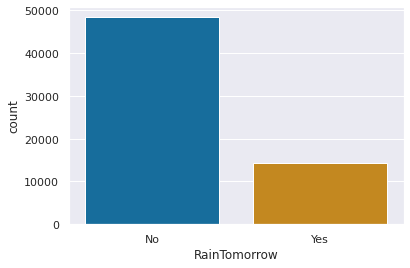

In [27]:
print(df.shape)
print(df['RainTomorrow'].value_counts(normalize = True))
sns.countplot(x='RainTomorrow', data=df)

Podemos ver, que hay 62806 en 24 variables del dataset

Realizamos el Analisis de Univariado para encontrar insights

Veamos las frecuencias

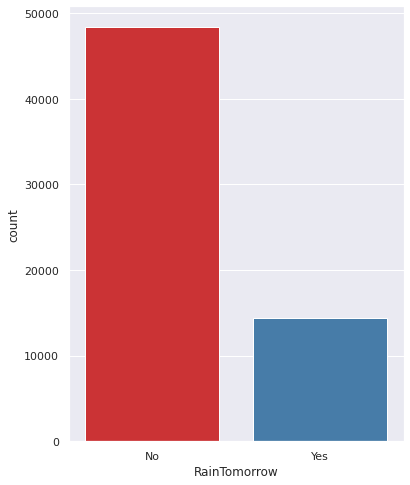

In [63]:
f, ax = plt.subplots(figsize=(6, 8))
ax = sns.countplot(x="RainTomorrow", data=df, palette="Set1")
plt.show()

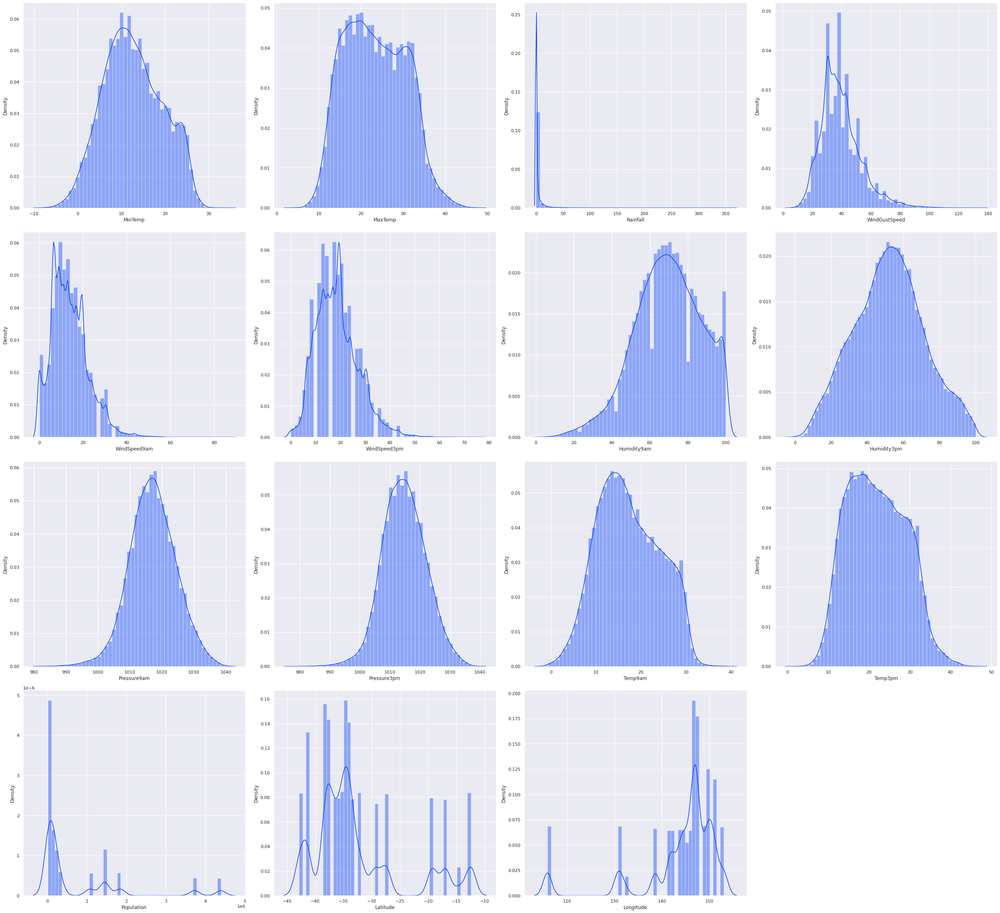

In [65]:
a = 4  # numero de filas
b = 4  # numero de columnas
c = 1  # contador de inicializacion
fig = plt.figure(figsize=(35,32))
for i in df:
    if df[i].dtype=='float64':
        plt.subplot(a, b, c)
        sns.distplot(df[i])
        c = c+1
    else:
        continue
plt.tight_layout()
plt.show()       

De los graficos de distribucion,podemos ver que ciertas variables tienen caracteristicas en comun en el eje X como  WindSpeed9am y WindSpeed3pm presentan similitudes entre 15-20.

In [28]:
sns.set_palette("dark")

Histograma de temperaturas

Text(0.5, 0, 'Temperatura a las 3pm')

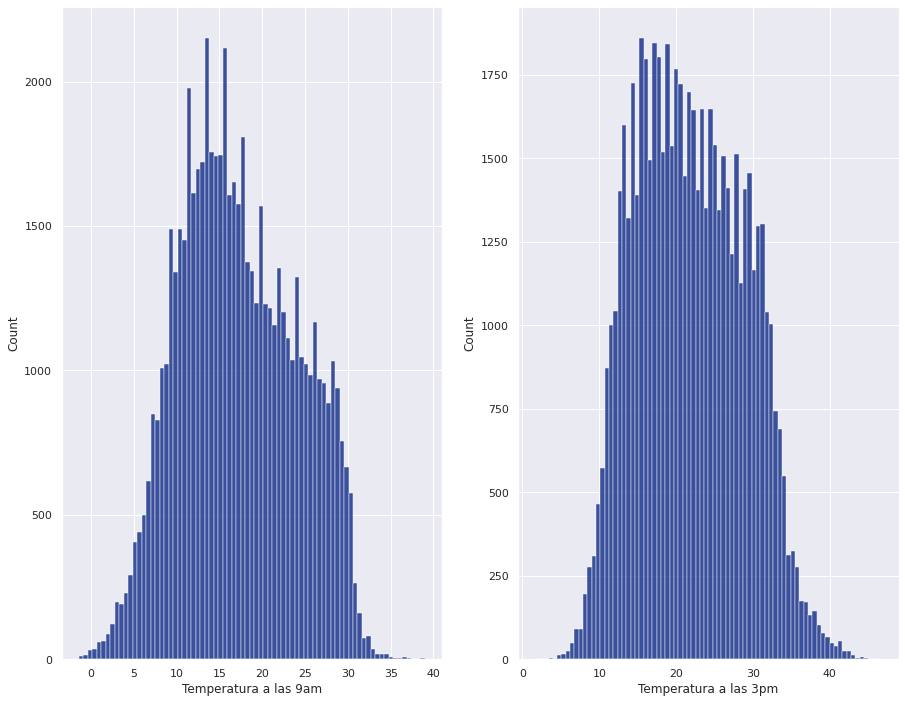

In [29]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,12))
ax1 = sns.histplot(data=df,x='Temp9am', palette=['b'], ax=ax1)
ax2 = sns.histplot(data=df,x='Temp3pm', palette=['y'], ax=ax2)
ax1.set_xlabel('Temperatura a las 9am', fontsize=12)
ax2.set_xlabel('Temperatura a las 3pm', fontsize=12)

Se observa con claridad que en Australia las temperaturas normales son alrededor de los 10 y 25 grados

SERIE DE TIEMPO CON LAS LLUVIAS EN CADA AÑO

In [30]:
lluvia_anio= df['Rainfall'].groupby(df['Year']).sum()[2:10]
lluvia_anio

Year
2009    16297.4
2010    21198.9
2011    20847.8
2012    17032.2
2013    17007.4
2014    16052.5
2015    15574.0
2016    17211.6
Name: Rainfall, dtype: float64

In [31]:
anios = df['Year'].unique()[1:9]
anios

array([2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016])

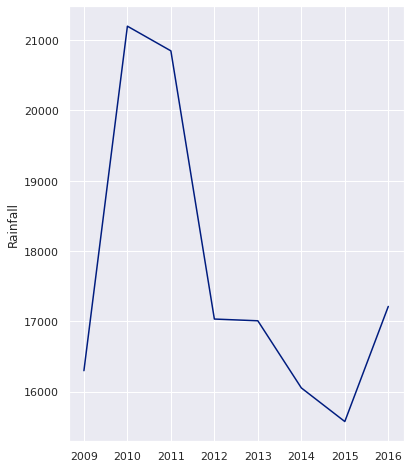

In [32]:
fig, ax = plt.subplots(figsize=(6, 8))
ax = sns.lineplot(x= anios, y= lluvia_anio)

MEDIDAS DE TENDENCIA CENTRAL

In [33]:
import scipy 
scipy.stats.describe(lluvia_anio)

DescribeResult(nobs=8, minmax=(15574.0, 21198.9), mean=17652.725, variance=4642667.402142858, skewness=0.9320065368112728, kurtosis=-0.7934017191939287)

In [37]:
media_geo = scipy.stats.gmean(lluvia_anio)
moda = scipy.stats.mode(lluvia_anio)
print('La media geometrica es :', media_geo)
print('La moda es:', moda) 

La media geometrica es : 17544.685247206562
La moda es: ModeResult(mode=array([15574.]), count=array([1]))


MEDIDAS DE DISPERCION

In [38]:
coef = scipy.stats.variation(lluvia_anio)
iqr = scipy.stats.iqr(lluvia_anio)
errorstd = scipy.stats.sem(lluvia_anio)
print('coeficiente de variacion', coef)
print('Calculo del IQR', iqr)
print('Error standar', errorstd)

coeficiente de variacion 0.11417632413043069
Calculo del IQR 1884.4749999999985
Error standar 761.7961835477106


ANALISIS BIVARIADO

In [39]:
df.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,Population,Latitude,Longitude,Year,Day_of_year
count,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,62806.000000,6.280600e+04,62806.000000,62806.000000,62806.000000,62806.000000
mean,12.664101,23.377509,2.466067,39.420947,13.806436,18.628586,69.269942,52.206811,1017.141165,1014.789733,17.236981,21.884396,6.824919e+05,-32.580404,144.098762,2012.608079,180.627233
std,6.724089,7.173630,9.027942,13.522032,8.370388,8.447185,17.306376,19.339115,7.299678,7.222134,6.820454,7.019665,1.123897e+06,8.179327,8.299189,2.556842,105.048517
min,-8.000000,4.100000,0.000000,6.000000,0.000000,0.000000,5.000000,1.000000,982.200000,977.100000,-1.400000,1.700000,8.205000e+03,-42.883209,115.861397,2007.000000,1.000000
25%,7.700000,17.500000,0.000000,30.000000,7.000000,13.000000,58.000000,39.000000,1012.400000,1009.900000,12.000000,16.200000,4.786700e+04,-37.813938,142.162506,2010.000000,89.000000
50%,12.200000,23.000000,0.000000,37.000000,13.000000,17.000000,70.000000,52.000000,1017.000000,1014.600000,16.600000,21.500000,1.389590e+05,-34.928661,146.923935,2013.000000,179.000000
75%,17.600000,29.200000,0.800000,46.000000,19.000000,24.000000,82.000000,65.000000,1021.900000,1019.600000,22.500000,27.400000,1.074168e+06,-29.462780,149.134350,2015.000000,271.000000
max,33.900000,47.300000,367.600000,135.000000,87.000000,76.000000,100.000000,100.000000,1040.600000,1039.600000,39.000000,46.700000,4.394585e+06,-12.457220,153.024292,2017.000000,366.000000


Se puede observar con más claridad que, las temperaturas promedios de ambas variables se ubican entre los 10 y 25 grados

Text(0.5, 0, 'Humedad a las 15 horas')

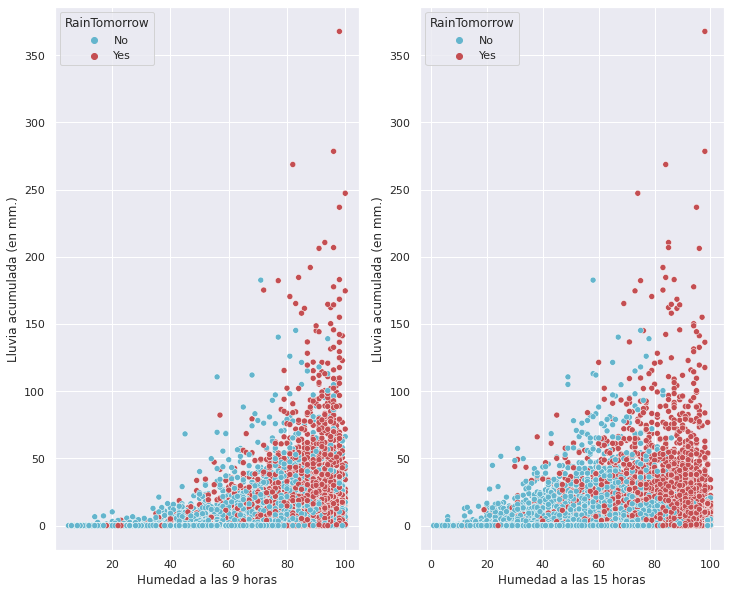

In [40]:
sns.set_palette("bright")

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,10))
sns.scatterplot(data=df, x="Humidity9am", y="Rainfall", hue="RainTomorrow", palette=['c', 'r'], ax = ax1)
sns.scatterplot(data=df, x="Humidity3pm", y="Rainfall", hue="RainTomorrow", palette=['c', 'r'], ax = ax2)
ax1.set_ylabel('Lluvia acumulada (en mm.)', fontsize=12)
ax2.set_ylabel('Lluvia acumulada (en mm.)', fontsize=12)
ax1.set_xlabel('Humedad a las 9 horas', fontsize=12)
ax2.set_xlabel('Humedad a las 15 horas', fontsize=12)

Se repite el histograma de las temperaturas pero en este caso utilizand la variable RainTomorrow pasando el mismo a ser bivariado

Text(0.5, 0, 'Temperatura a las 15 horas')

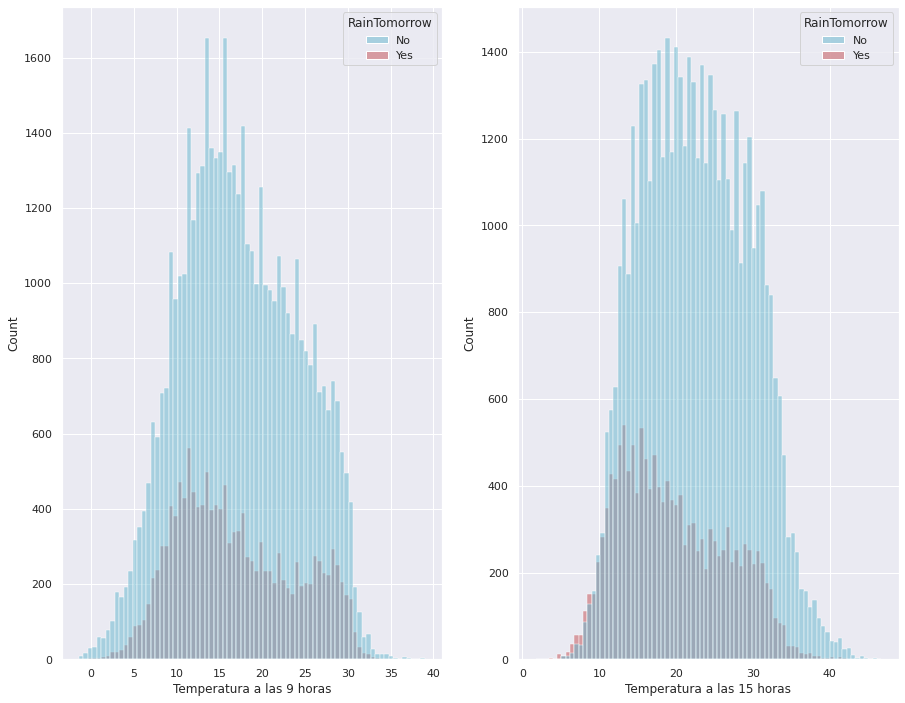

In [41]:
sns.set_palette("bright")

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,12))
ax1 = sns.histplot(data=df,x='Temp9am', palette=['c', 'r'], hue="RainTomorrow", ax=ax1)
ax2 = sns.histplot(data=df,x='Temp3pm', palette=['c', 'r'], hue="RainTomorrow", ax=ax2)
ax1.set_xlabel('Temperatura a las 9 horas', fontsize=12)
ax2.set_xlabel('Temperatura a las 15 horas', fontsize=12)

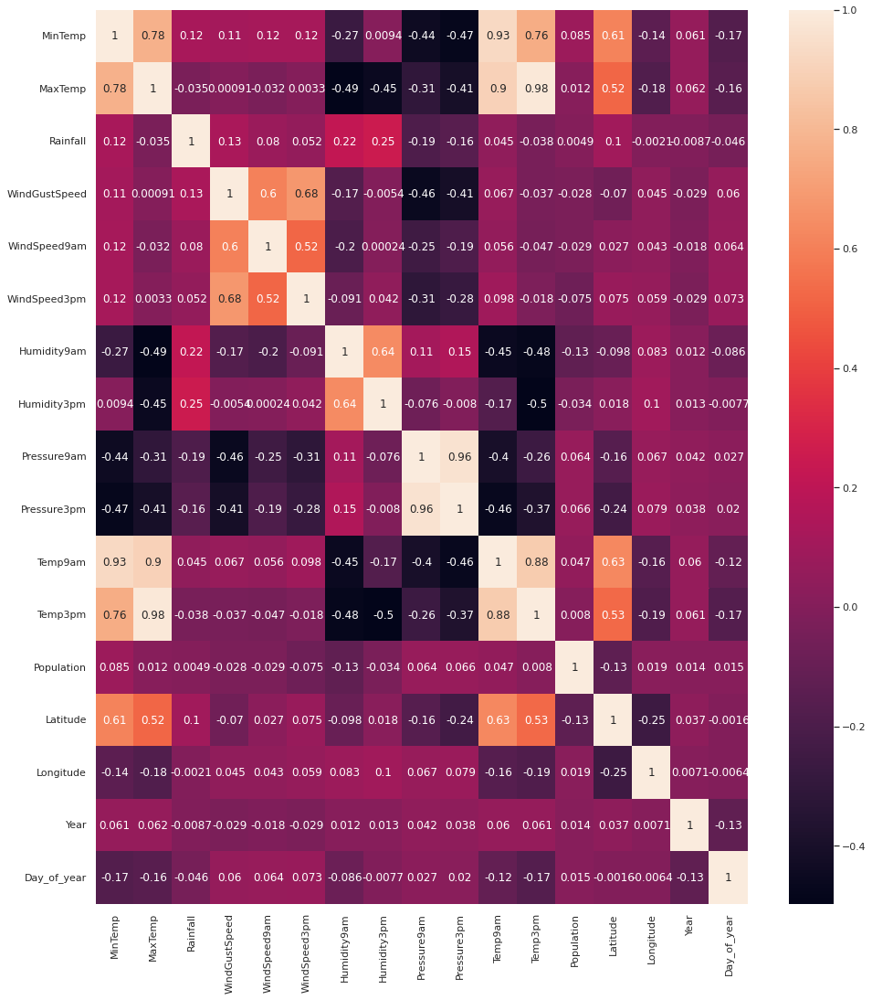

In [42]:
plt.figure(figsize=(16, 18))

au_corr = df.corr()
sns.heatmap(au_corr, 
            xticklabels = au_corr.columns.values,
            yticklabels = au_corr.columns.values,
            annot = True);

Del mapa de correlacion podemos decir que las mas correlacionadas son:
-MinTemp y MaxTemp 
-MinTemp y Temp9am 
-MinTemp y Temp3pm 
-MaxTemp y Temp9am 
-MaxTemp y Temp3pm 
-Pressure9am y Pressure3pm 
-Temp9am y Temp3pm 

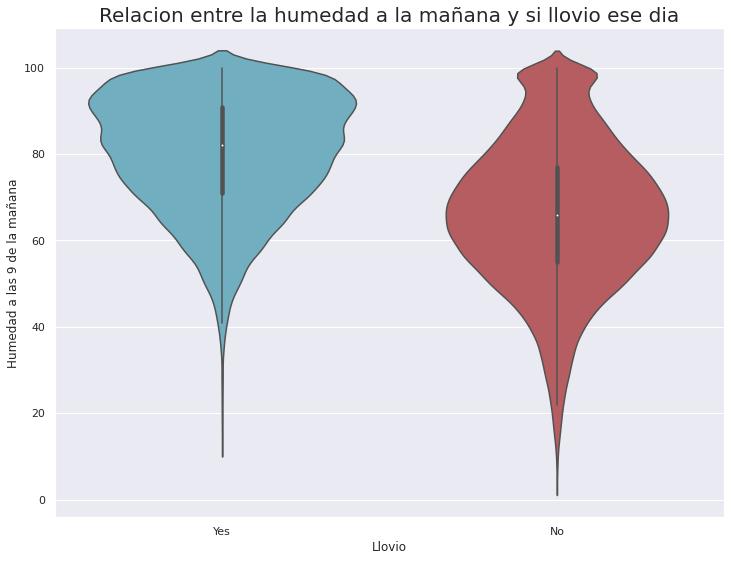

In [43]:
plt.rcParams['figure.figsize'] = (12, 9)
sns.violinplot(df['RainToday'], df['Humidity9am'],  palette=['c', 'r'])
plt.title('Relacion entre la humedad a la mañana y si llovio ese dia', fontsize = 20)
plt.xlabel('Llovio')
plt.ylabel('Humedad a las 9 de la mañana')
plt.show()

Se observa que a mayor humedad es más probable que ese día llueva

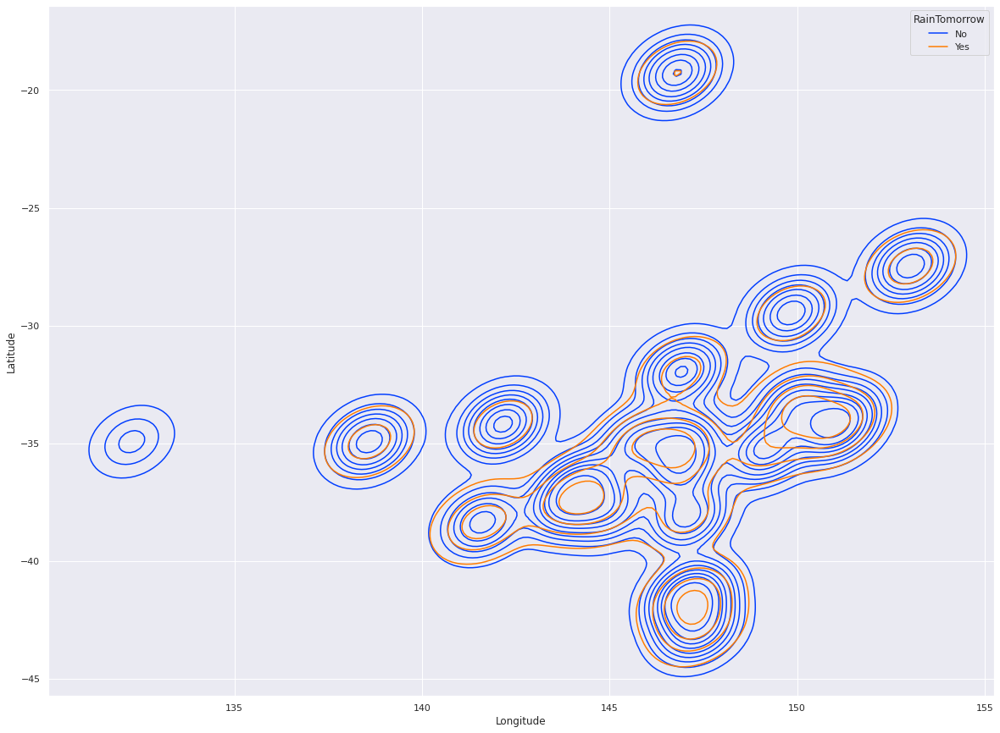

In [86]:
plt.figure(figsize=(20,15))
sns.kdeplot(data = df, x = 'Longitude',y = 'Latitude',hue = 'RainTomorrow')

Llueve mas en el sudeste que en otras regiones

In [89]:
max_amount = float(df['Rainfall'].max())

folium_hmap = folium.Map(location=[-25.27,133.77],
                        zoom_start=4,
                        tiles="OpenStreetMap")

hm_wide = HeatMap(list(zip(df['Latitude'], df['Longitude'], df['Rainfall'])),
                   min_opacity=0.8,
                   max_val=max_amount,
                   radius=10, blur=6, 
                   max_zoom=15,
                  )
folium_hmap.add_child(hm_wide)


Puede verse a simple vista que como indicamos anteriormente, las ciudades costeras son las que resaltan por sobre el resto en cantidad de lluvias

Text(0.5, 0, 'Humedad a las 9 horas')

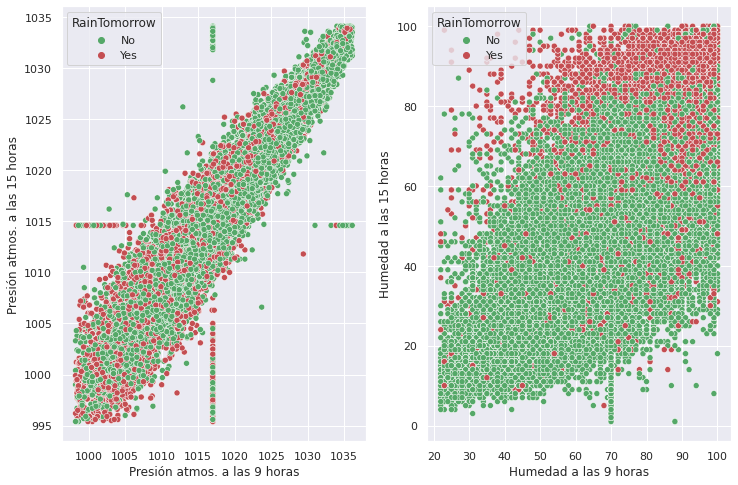

In [92]:
sns.set_palette("bright")

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,8))

sns.scatterplot(x='Pressure9am', y='Pressure3pm', data=df, hue='RainTomorrow', palette=['g', 'r'], ax=axes[0])
sns.scatterplot(x='Humidity9am', y='Humidity3pm', data=df, hue='RainTomorrow', palette=['g', 'r'],ax=axes[1])
axes[0].set_ylabel('Presión atmos. a las 15 horas', fontsize=12)
axes[0].set_xlabel('Presión atmos. a las 9 horas', fontsize=12)
axes[1].set_ylabel('Humedad a las 15 horas', fontsize=12)
axes[1].set_xlabel('Humedad a las 9 horas', fontsize=12)

Se observa que hay mas chances de que llueva cuando la humedad es alta y la presion es baja. Esto es asi debido a que cuando la presion atmosferica es baja nos encontramos con más humedad en la zona.

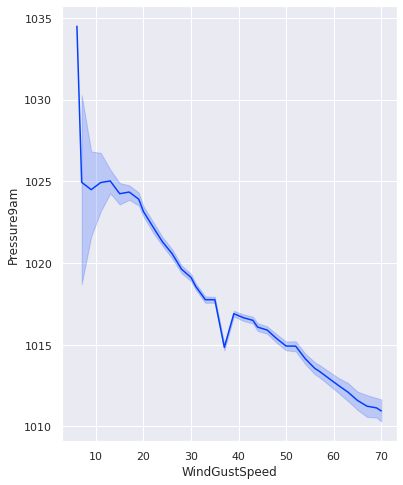

In [97]:
fig, ax = plt.subplots(figsize=(6, 8))
ax = sns.lineplot(x= df["WindGustSpeed"] , y= df["Pressure9am"])

Al incrementar el viento decrece la presion atmosferica. Este es uno de los principios basicos de la metereologia ya que el viento se dirige de la zona de mayor presión a la de menor presión, por tanto, la diferencia en la presión atmosférica incide en la velocidad del viento.

Deteccion de OUTLIERS

Vamos a utilizar el metodo de boxplot para detectar outliers

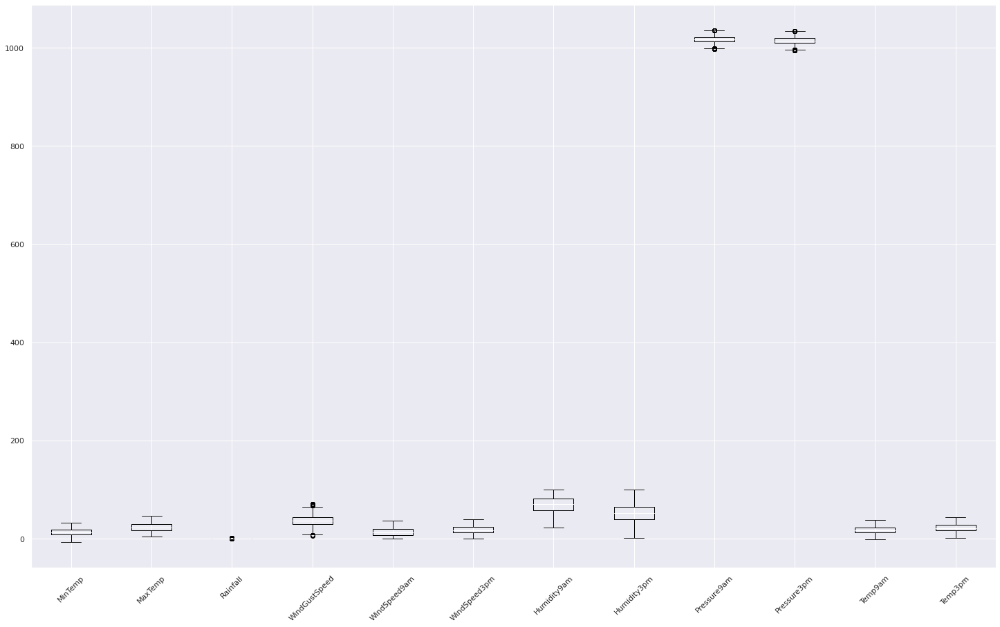

In [88]:
plt.figure(figsize=[25,15])
df.boxplot(column= ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm'])
plt.xticks(rotation=45)
plt.show()


Luego de ser detectado,vamos a usar la Imputacion por mediana reemplazando los valores extremos por la mediana.
Esta representado por la formula IQR = Q3 − Q1. Usando el rango intercuartil para cada variable

In [75]:
for i in df:
    if df[i].dtype=='float64':
        q1 = df[i].quantile(0.25)
        q3 = df[i].quantile(0.75)
        iqr = q3-q1
        Lower_tail = q1 - 1.5 * iqr
        Upper_tail = q3 + 1.5 * iqr
        med = np.median(df[i])
        for j in df[i]:
            if j > Upper_tail or j < Lower_tail:
                df[i] = df[i].replace(j, med)
    else:
        continue

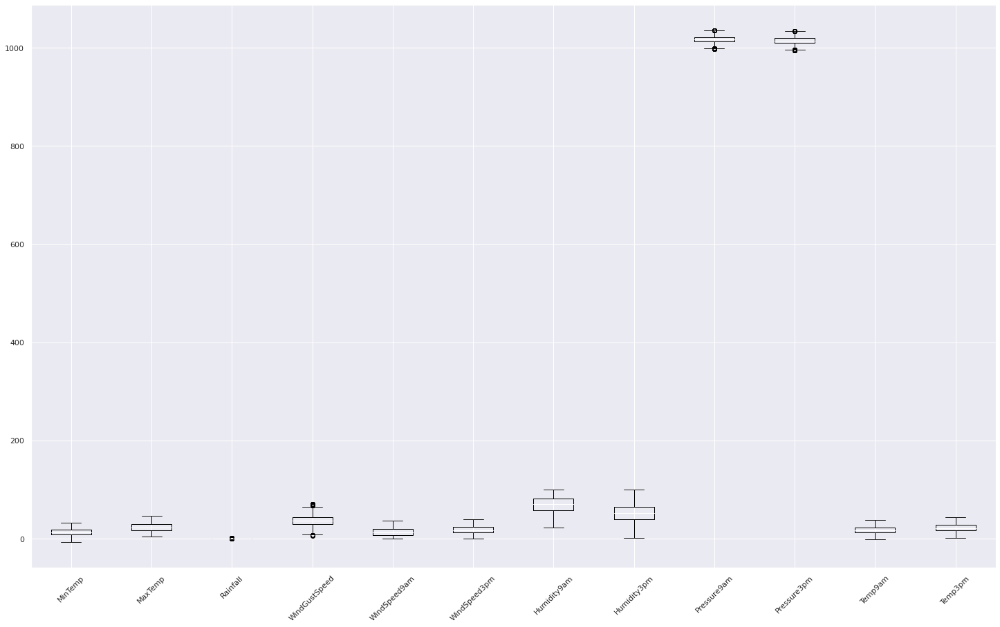

In [76]:
plt.figure(figsize=[25,15])
df.boxplot(column= ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm'])
plt.xticks(rotation=45)
plt.show()

Corroboramos que los outliers fueron arreglados por medio del pairplot

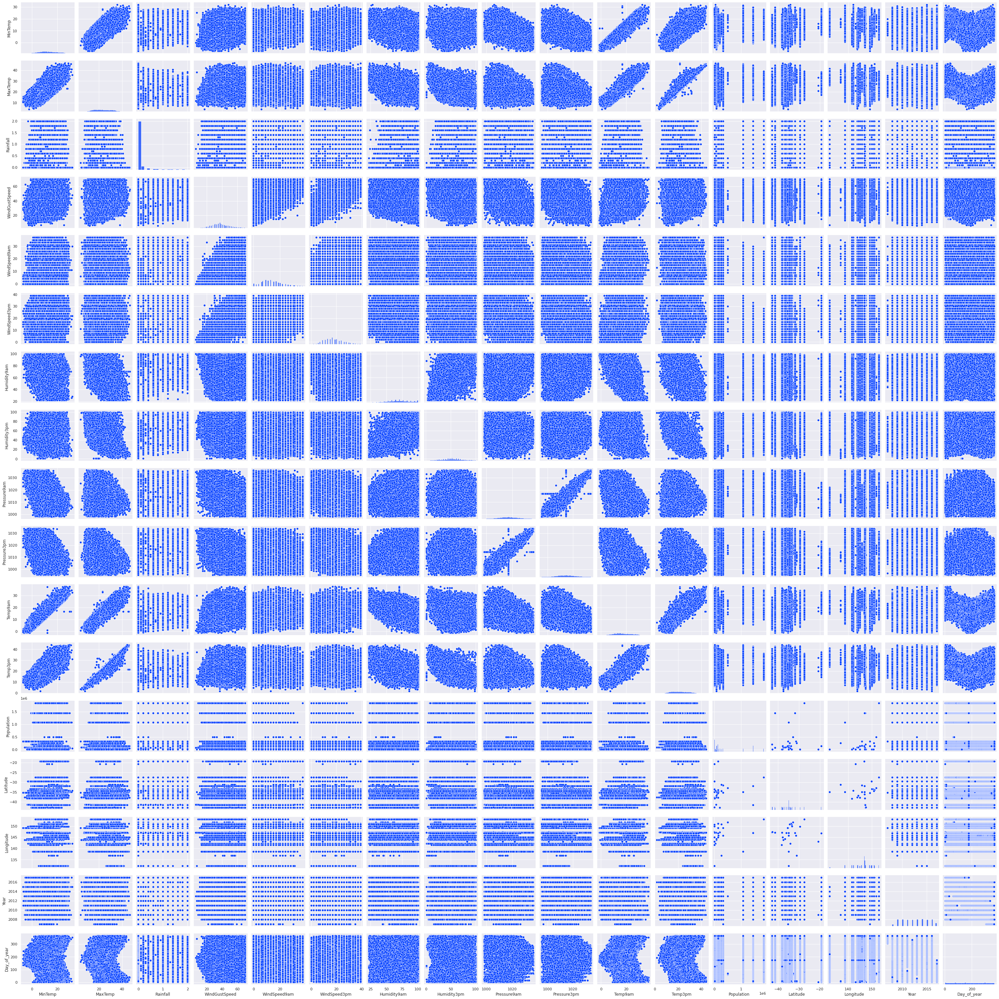

In [78]:
sns.pairplot(data=df)
plt.show()